In [6]:
# Download dataset from Kaggle if not available locally, define dataset and output folders,
# set up paths for brain processing (FSL), search for T2w MRI scans,
# and prepare working directories inside WSL.

import re
import subprocess
from pathlib import Path
import kagglehub 

DATASET_DIR = Path(r"C:\Users\nina-\iCloudDrive\Documenten Nina\Data Science and Society\Early thesis proposal\THESIS MS\MS dataset")
if not DATASET_DIR.exists():
    print("Dataset not found locally. Attempting to download from Kaggle...")
    DATASET_DIR = Path(kagglehub.dataset_download("orvile/multiple-sclerosis-brain-mri-lesion-segmentation"))
    print("Dataset downloaded to:", DATASET_DIR)
else:
    print("Using local dataset at:", DATASET_DIR)

WIN_OUT_ROOT = Path(r"C:\Users\nina-\iCloudDrive\Documenten Nina\Data Science and Society\Early thesis proposal\THESIS MS\T2_pipeline_final")
WIN_OUT_ROOT.mkdir(parents=True, exist_ok=True)
REF_WSL = "/home/nina/fsl/data/standard/T2_pipeline_final.nii.gz"

def wsl(cmd):
    p = subprocess.run(["wsl", "bash", "-lc", cmd], text=True, capture_output=True)
    if p.returncode != 0 and p.stderr:
        print(p.stderr)
    return p

def wslpath(path):
    return subprocess.check_output(["wsl", "wslpath", "-a", str(path)], text=True).strip()

if wsl("command -v dc >/dev/null 2>&1").returncode != 0:
    raise RuntimeError("WSL is missing 'dc'. Install with: sudo apt-get install -y bc dc")

pat = re.compile(r"^\d+-T2\.nii(\.gz)?$")
t2 = sorted(p for p in DATASET_DIR.glob("Patient-*/*.nii*") if pat.match(p.name))

print("Found T2 scans:", len(t2))

if not t2:
    raise RuntimeError("No T2 scans found.")

wsl("mkdir -p /home/nina/ms_work/data /home/nina/ms_work_final/out")

Using local dataset at: C:\Users\nina-\iCloudDrive\Documenten Nina\Data Science and Society\Early thesis proposal\THESIS MS\MS dataset
Found T2 scans: 60


CompletedProcess(args=['wsl', 'bash', '-lc', 'mkdir -p /home/nina/ms_work/data /home/nina/ms_work_final/out'], returncode=0, stdout='', stderr='')

In [124]:
# Copy all identified T2 scans from the Windows dataset into the WSL working directory. 

failed_copy = []

for inp in t2:
    patient = inp.parent.name
    pid = int(patient.split("-")[1])

    wsl_dir = f"/home/nina/ms_work_final/data/{patient}"
    wsl(f"mkdir -p '{wsl_dir}'")

    inp_wsl = wslpath(inp)
    suffix = ".nii.gz" if inp.name.endswith(".nii.gz") else ".nii"
    out_wsl = f"{wsl_dir}/{pid}-T2{suffix}"

    if wsl(f"cp -f '{inp_wsl}' '{out_wsl}'").returncode != 0:
        failed_copy.append(patient)

print("Copy done. Failed:", len(failed_copy))

Copy done. Failed: 0


In [159]:
# Fixes the NifTI head orientation information using FSL tools (set to the default value) 
# due to the fact that there was no orientation information in the NIfTI headers avalaible in the data. 
# However, this is necessary for further preprocessing steps in FSL. 
# There was a technical check after if the qform en sform were available and set to the default value.  

import subprocess

failed_header = []

for inp in t2:
    patient = inp.parent.name
    pid = int(patient.split("-")[1])

    suffix = ".nii.gz" if inp.name.endswith(".nii.gz") else ".nii"
    wsl_in = f"/home/nina/ms_work_final/data/{patient}/{pid}-T2{suffix}"

    rc = wsl(
        f"fslorient -setqformcode 1 '{wsl_in}' && "
        f"fslorient -copyqform2sform '{wsl_in}' && "
        f"fslorient -setsformcode 1 '{wsl_in}'"
    ).returncode

    if rc != 0:
        failed_header.append(patient)

print("Header-fix done. Failed:", len(failed_header), failed_header[:10])

PATIENT="Patient-1"
PID=1
WSL_IN=f"/home/nina/ms_work_final/data/{PATIENT}/{PID}-T2.nii"

def wsl(cmd):
    p = subprocess.run(["wsl","bash","-lc",cmd], text=True, capture_output=True)
    print("CMD:", cmd)
    print("RC:", p.returncode)
    if p.stdout: print("STDOUT:\n", p.stdout)
    if p.stderr: print("STDERR:\n", p.stderr)
    return p

wsl(f"fslhd '{WSL_IN}' | egrep 'qform_code|sform_code|qto_xyz:|sto_xyz:'")

Header-fix done. Failed: 0 []
CMD: fslhd '/home/nina/ms_work_final/data/Patient-1/1-T2.nii' | egrep 'qform_code|sform_code|qto_xyz:|sto_xyz:'
RC: 0
STDOUT:
 qform_code	1
qto_xyz:1	1.000000 0.000000 0.000000 0.000000 
qto_xyz:2	0.000000 1.000000 0.000000 0.000000 
qto_xyz:3	0.000000 0.000000 1.000000 0.000000 
qto_xyz:4	0.000000 0.000000 0.000000 1.000000 
sform_code	1
sto_xyz:1	1.000000 0.000000 0.000000 0.000000 
sto_xyz:2	0.000000 1.000000 0.000000 0.000000 
sto_xyz:3	0.000000 0.000000 1.000000 0.000000 
sto_xyz:4	0.000000 0.000000 0.000000 1.000000 



CompletedProcess(args=['wsl', 'bash', '-lc', "fslhd '/home/nina/ms_work_final/data/Patient-1/1-T2.nii' | egrep 'qform_code|sform_code|qto_xyz:|sto_xyz:'"], returncode=0, stdout='qform_code\t1\nqto_xyz:1\t1.000000 0.000000 0.000000 0.000000 \nqto_xyz:2\t0.000000 1.000000 0.000000 0.000000 \nqto_xyz:3\t0.000000 0.000000 1.000000 0.000000 \nqto_xyz:4\t0.000000 0.000000 0.000000 1.000000 \nsform_code\t1\nsto_xyz:1\t1.000000 0.000000 0.000000 0.000000 \nsto_xyz:2\t0.000000 1.000000 0.000000 0.000000 \nsto_xyz:3\t0.000000 0.000000 1.000000 0.000000 \nsto_xyz:4\t0.000000 0.000000 0.000000 1.000000 \n', stderr='')

In [161]:
# Reorientate all T2w MRI scans to standard orientation using fslreorient2std 

failed_reor = []

for inp in t2:
    patient = inp.parent.name
    pid = int(patient.split("-")[1])
    base = f"P{pid:03d}"

    suffix = ".nii.gz" if inp.name.endswith(".nii.gz") else ".nii"
    wsl_in = f"/home/nina/ms_work_final/data/{patient}/{pid}-T2{suffix}"

    wsl_out_dir = f"/home/nina/ms_work_final/out/{patient}"
    wsl(f"mkdir -p '{wsl_out_dir}'")

    reor = f"{wsl_out_dir}/{base}_reor.nii.gz"

    if wsl(f"fslreorient2std '{wsl_in}' '{reor}'").returncode != 0:
        failed_reor.append(patient)

print("Reorient done. Failed:", len(failed_reor), failed_reor[:10])

CMD: mkdir -p '/home/nina/ms_work_final/out/Patient-1'
RC: 0
CMD: fslreorient2std '/home/nina/ms_work_final/data/Patient-1/1-T2.nii' '/home/nina/ms_work_final/out/Patient-1/P001_reor.nii.gz'
RC: 0
CMD: mkdir -p '/home/nina/ms_work_final/out/Patient-10'
RC: 0
CMD: fslreorient2std '/home/nina/ms_work_final/data/Patient-10/10-T2.nii' '/home/nina/ms_work_final/out/Patient-10/P010_reor.nii.gz'
RC: 0
CMD: mkdir -p '/home/nina/ms_work_final/out/Patient-11'
RC: 0
CMD: fslreorient2std '/home/nina/ms_work_final/data/Patient-11/11-T2.nii' '/home/nina/ms_work_final/out/Patient-11/P011_reor.nii.gz'
RC: 0
CMD: mkdir -p '/home/nina/ms_work_final/out/Patient-12'
RC: 0
CMD: fslreorient2std '/home/nina/ms_work_final/data/Patient-12/12-T2.nii' '/home/nina/ms_work_final/out/Patient-12/P012_reor.nii.gz'
RC: 0
CMD: mkdir -p '/home/nina/ms_work_final/out/Patient-13'
RC: 0
CMD: fslreorient2std '/home/nina/ms_work_final/data/Patient-13/13-T2.nii' '/home/nina/ms_work_final/out/Patient-13/P013_reor.nii.gz'
RC: 0

Total scans found: 60


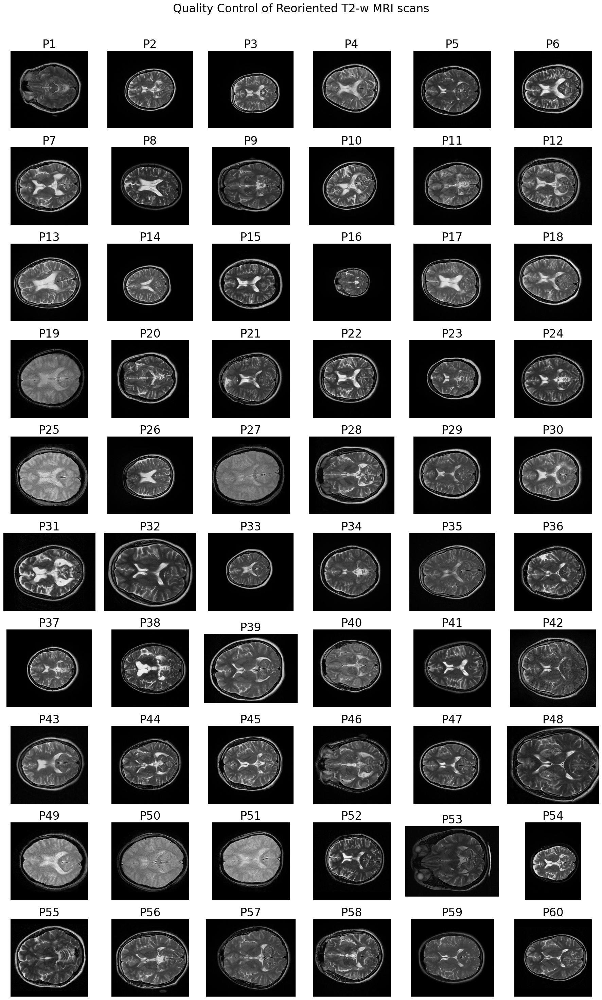

In [165]:
# Quality control reoriented T2w scans (slice in the middle) 

from pathlib import Path
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

root = Path(r"\\wsl$\Ubuntu\home\nina\ms_work_final\out")

def extract_patient_number(path):
    name = path.parent.name  
    return int(name.split("-")[1])

reor_files = sorted(
    root.glob("Patient-*/*_reor.nii.gz"),
    key=extract_patient_number
)
print("Total scans found:", len(reor_files))

n = min(60, len(reor_files))
cols = 6
rows = int(np.ceil(n / cols))

fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 3))
axes = np.array(axes).reshape(rows, cols)

for i in range(rows * cols):
    ax = axes.flat[i]

    if i < n:
        img = nib.load(str(reor_files[i]))
        data = img.get_fdata()
        z = data.shape[2] // 2

        sl = data[:, :, z]
        sl = (sl - sl.min()) / (sl.max() - sl.min() + 1e-8)

        ax.imshow(np.rot90(sl), cmap="gray")
        ax.set_title(reor_files[i].parent.name.replace("Patient-", "P"), fontsize=24)
        ax.axis("off")
    else:
        ax.axis("off")

plt.suptitle("Quality Control of Reoriented T2-w MRI scans", fontsize=24)
plt.tight_layout(rect=[0, 0, 1, 0.97])

plt.savefig("qc_t2_reoriented.png", dpi=300, bbox_inches="tight")
plt.show()

In [171]:
# preprocessing step to obtain the same shape for every T2w scan 
# three steps: brain-cropping → centering → resampling (to lowest shape) 


import nibabel as nib
import numpy as np
from nilearn.image import resample_img
from pathlib import Path

root = Path(r"\\wsl$\Ubuntu\home\nina\ms_work_final\out")
reor_files = sorted(root.glob("Patient-*/*_reor.nii.gz"))
print("Number of reor files:", len(reor_files))

target_shape = (224, 224, 15)  
PERCENTILE = 25                 
PAD = 20                         

ref = nib.load(str(reor_files[0]))
vox = ref.header.get_zooms()[:3]
base_aff = np.diag([vox[0], vox[1], vox[2], 1.0])

def bbox(data, p=PERCENTILE):
    vals = data[data > 0]
    if vals.size == 0:
        return None
    thr = np.percentile(vals, p)
    m = data > thr
    coords = np.array(np.where(m))
    if coords.size == 0:
        return None
    mins = coords.min(axis=1)
    maxs = coords.max(axis=1) + 1
    return mins, maxs

def crop_with_pad(img, mins, maxs, pad=PAD):
    data = img.get_fdata()
    shape = np.array(data.shape[:3])

    mins2 = np.maximum(mins - pad, 0)
    maxs2 = np.minimum(maxs + pad, shape)

    cropped = data[mins2[0]:maxs2[0], mins2[1]:maxs2[1], mins2[2]:maxs2[2]]

    new_aff = img.affine.copy()
    shift_vox = np.array([mins2[0], mins2[1], mins2[2], 1.0])
    shift_mm = img.affine @ shift_vox
    new_aff[:3, 3] = shift_mm[:3]

    return nib.Nifti1Image(cropped, new_aff)

def centered_target_affine(img, base_affine, target_shape):
    aff = base_affine.copy()
    in_shape = np.array(img.shape[:3], float)
    tgt_shape = np.array(target_shape, float)
    in_c  = (in_shape - 1) / 2.0
    tgt_c = (tgt_shape - 1) / 2.0
    in_w = nib.affines.apply_affine(img.affine, in_c)
    tgt_w = nib.affines.apply_affine(aff, tgt_c)
    aff[:3, 3] += (in_w - tgt_w)
    return aff

failed = []
out_paths = []

for i, f in enumerate(reor_files, 1):
    patient = f.parent.name
    out_path = f.with_name(f.name.replace("_reor.nii.gz", "_resampled224.nii.gz"))

    img = nib.load(str(f))
    data = np.nan_to_num(img.get_fdata())

    bb = bbox(data)

    mins, maxs = bb
    cropped = crop_with_pad(img, mins, maxs, pad=PAD)

    targ_aff = centered_target_affine(cropped, base_aff, target_shape)

    res = resample_img(cropped, target_affine=targ_aff, target_shape=target_shape,
                       interpolation="continuous")
    nib.save(res, str(out_path))

    if i <= 3:
        print(f"[{i}] {patient} cropped {cropped.shape} -> {res.shape}")

    out_paths.append(out_path)

print("Done. Saved:", len(out_paths), "Failed:", len(failed), failed) 

Number of reor files: 60
[1] Patient-1 cropped (256, 256, 19) -> (224, 224, 15)
[2] Patient-10 cropped (512, 464, 20) -> (224, 224, 15)
[3] Patient-11 cropped (256, 256, 18) -> (224, 224, 15)
Done. Saved: 60 Failed: 0 []


Total files found: 60


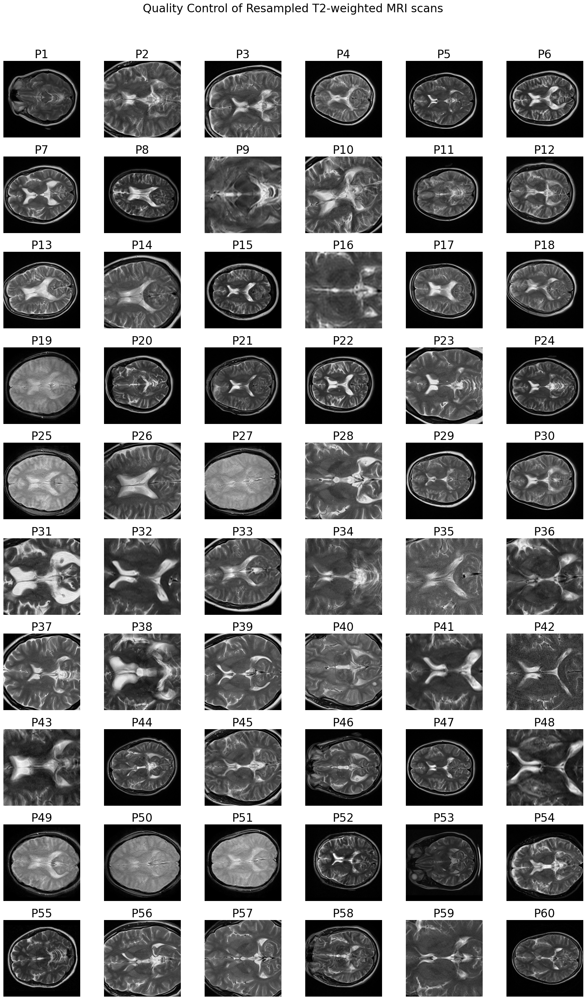

In [184]:
# Quality control resampled scans (slice in the middle)

from pathlib import Path
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

root = Path(r"\\wsl$\Ubuntu\home\nina\ms_work_final\out")

def extract_patient_number(path):
    return int(path.parent.name.split("-")[1])

resampled_files = sorted(
    root.glob("Patient-*/*_resampled224.nii.gz"),
    key=extract_patient_number
)

print("Total files found:", len(resampled_files))

n_show = min(60, len(resampled_files))
cols = 6
rows = int(np.ceil(n_show / cols))

fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 3))
axes = np.array(axes).reshape(rows, cols)

for i in range(rows * cols):
    ax = axes.flat[i]

    if i < n_show:
        f = resampled_files[i]
        patient_num = extract_patient_number(f)
        patient_label = f"P{patient_num}"

        img = nib.load(str(f))
        data = img.get_fdata()

        z = data.shape[2] // 2
        sl = data[:, :, z]

        ax.imshow(np.rot90(sl), cmap="gray")
        ax.set_title(patient_label, fontsize=24)
        ax.axis("off")
    else:
        ax.axis("off")

plt.suptitle("Quality Control of Resampled T2-weighted MRI scans", fontsize=24)
plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.savefig("qc_resampled_middle_slices.png", dpi=300, bbox_inches="tight")
plt.show()

In [177]:
# create a robust group-level brain mask. 
# Thresholding each image individually, 
# converting them into binary masks, 
# combining them using a majority vote apprach, 
# saving one final global mask. 

import nibabel as nib
import numpy as np
from pathlib import Path

root = Path(r"\\wsl$\Ubuntu\home\nina\ms_work_final\out")  
files = sorted(root.rglob("*Patient-*/*_resampled224.nii.gz"))
print("Total files resampled:", len(files))

PERCENTILE = 30  
KEEP_FRAC = 0.5   

masks = []
ref_img = nib.load(str(files[0]))
ref_aff = ref_img.affine
ref_hdr = ref_img.header

for f in files:
    data = np.nan_to_num(nib.load(str(f)).get_fdata())
    vals = data[data > 0]
    if vals.size == 0:
        masks.append(np.zeros_like(data, dtype=bool))
        continue
    thr = np.percentile(vals, PERCENTILE)
    masks.append(data > thr)

masks = np.stack(masks, axis=0)  
frac = masks.mean(axis=0)        

global_mask = (frac >= KEEP_FRAC).astype(np.uint8)

print("Global mask voxels:", int(global_mask.sum()))
print("Mask fraction kept:", float(global_mask.mean()))

mask_img = nib.Nifti1Image(global_mask, ref_aff, ref_hdr)
mask_path = root / "MAIN_mask.nii.gz"
nib.save(mask_img, str(mask_path))
print("Saved:", mask_path)

Total files resampled: 60
Global mask voxels: 549819
Mask fraction kept: 0.7305205676020409
Saved: \\wsl$\Ubuntu\home\nina\ms_work_final\out\MAIN_mask.nii.gz


Mask shape: (224, 224, 15)
Amount of voxels in mask: 549819


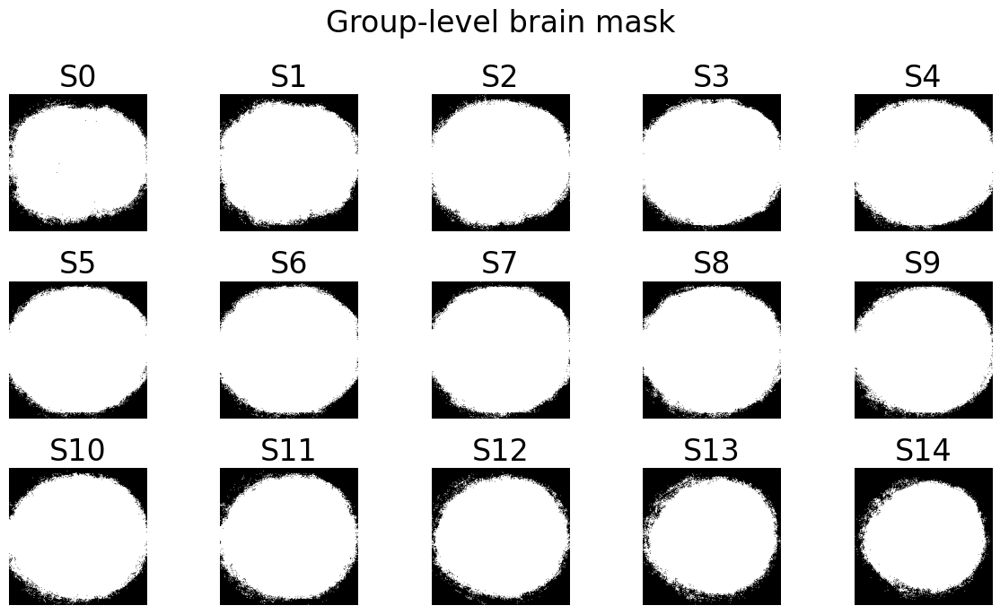

In [179]:
# Quality check main Mask 

from pathlib import Path
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

root = Path(r"\\wsl$\Ubuntu\home\nina\ms_work_final\out")
mask_path = root / "MAIN_mask.nii.gz"

mask_img = nib.load(str(mask_path))
mask = mask_img.get_fdata()

print("Mask shape:", mask.shape)
print("Amount of voxels in mask:", int(mask.sum()))

n_slices = mask.shape[2]
cols = 5
rows = int(np.ceil(n_slices / cols))

fig, axes = plt.subplots(rows, cols, figsize=(12, 7))
axes = np.array(axes).ravel()

for i in range(n_slices):
    axes[i].imshow(np.rot90(mask[:, :, i]), cmap="gray")
    axes[i].set_title(f"S{i}", fontsize=24)
    axes[i].axis("off")

for j in range(n_slices, len(axes)):
    axes[j].axis("off")

fig.suptitle(f"Group-level brain mask", fontsize=24)
plt.tight_layout()
plt.show()

In [181]:
# Apply main mask to T2 files 

import nibabel as nib
import numpy as np
from pathlib import Path

root = Path(r"\\wsl$\Ubuntu\home\nina\ms_work_final\out")

mask_path = root / "MAIN_mask.nii.gz"
files = sorted(root.glob("Patient-*/*_resampled224.nii.gz"))

print("Total files:", len(files))

mask_img = nib.load(str(mask_path))
mask = mask_img.get_fdata().astype(bool)

print("Mask shape:", mask.shape)

out_paths = []

for f in files:
    img = nib.load(str(f))
    data = np.nan_to_num(img.get_fdata())

    masked = data * mask

    out_path = f.with_name(
        f.name.replace("_resampled224.nii.gz", "_resampled224_masked.nii.gz")
    )

    nib.save(nib.Nifti1Image(masked, img.affine, img.header), str(out_path))
    out_paths.append(out_path)

print("Masked outputs:", len(out_paths))

Total files: 60
Mask shape: (224, 224, 15)
Masked outputs: 60


Amount of masked files: 60


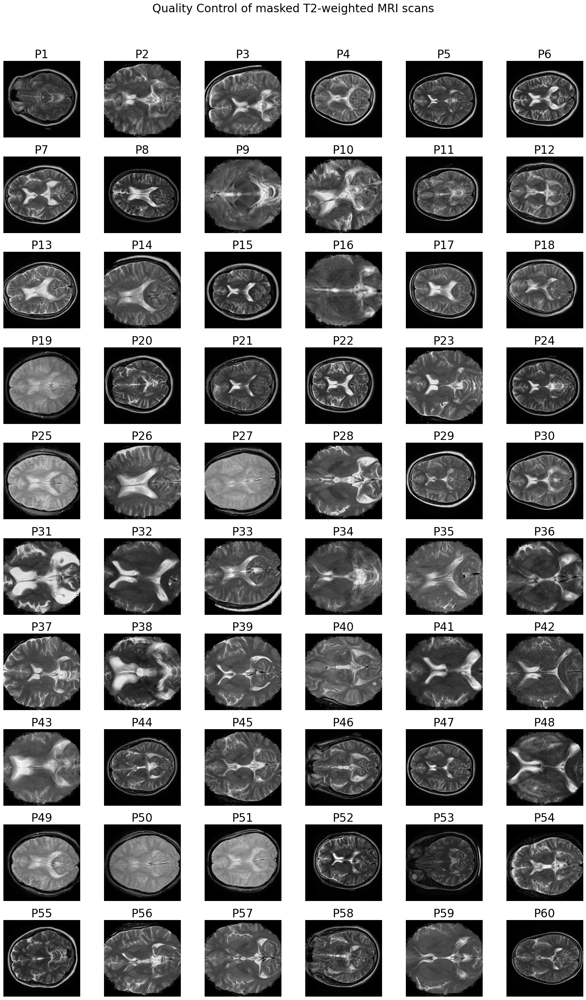

In [183]:
# quality control masked files 

from pathlib import Path
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

root = Path(r"\\wsl$\Ubuntu\home\nina\ms_work_final\out")

def extract_patient_number(path):
    return int(path.parent.name.split("-")[1])

masked_files = sorted(
    root.glob("Patient-*/*_resampled224_masked.nii.gz"),
    key=extract_patient_number
)

print("Amount of masked files:", len(masked_files))

n_show = min(60, len(masked_files))
cols = 6
rows = int(np.ceil(n_show / cols))

fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 3))
axes = np.array(axes).reshape(rows, cols)

for i in range(rows * cols):
    ax = axes.flat[i]

    if i < n_show:
        f = masked_files[i]
        patient_num = extract_patient_number(f)
        patient_label = f"P{patient_num}"

        img = nib.load(str(f))
        data = img.get_fdata()

        if data.ndim == 4:
            data = data[..., 0]

        z = data.shape[2] // 2
        sl = data[:, :, z]

        ax.imshow(np.rot90(sl), cmap="gray")
        ax.set_title(patient_label, fontsize=24)
        ax.axis("off")
    else:
        ax.axis("off")

plt.suptitle("Quality Control of masked T2-weighted MRI scans", fontsize=24)
plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.savefig("qc_masked_middle_slices.png", dpi=300, bbox_inches="tight")
plt.show()

In [189]:
# intensity normalisation per scan within global mask, to reduce extreme intensities. 
# mean= 0, stdev = 1, only within brain mask
# background = 0 

import nibabel as nib
import numpy as np
from pathlib import Path

root = Path(r"\\wsl$\Ubuntu\home\nina\ms_work_final\out")

ml_files = sorted(root.glob("Patient-*/*_resampled224_masked.nii.gz"))
print("Number of scans:", len(ml_files))

mask_path = root / "MAIN_mask.nii.gz"  
mask = nib.load(str(mask_path)).get_fdata().astype(bool)

failed = []

for i, f in enumerate(ml_files, 1):
    img = nib.load(str(f))
    data = np.nan_to_num(img.get_fdata())

    brain_vox = data[mask]

    p1, p99 = np.percentile(brain_vox, (1, 99))
    data = np.clip(data, p1, p99)

    brain_vox = data[mask]
    mean = brain_vox.mean()
    std = brain_vox.std()

    data_norm = (data - mean) / (std + 1e-8)

    data_norm[~mask] = 0

    out_path = f.with_name(f.name.replace("_resampled224_masked.nii.gz", "_resampled224_masked_norm.nii.gz"))
    nib.save(nib.Nifti1Image(data_norm, img.affine, img.header), str(out_path))

    if i <= 3:
        print(f"[{i}] {f.parent.name} mean={mean:.2f} std={std:.2f}")

print("\nDone.")
print("Failed:", failed)

Number of scans: 60
[1] Patient-1 mean=283.37 std=264.92
[2] Patient-10 mean=507.68 std=212.37
[3] Patient-11 mean=251.21 std=251.37

Done.
Failed: []


In [192]:
# Quality check intensity normalisation 

import nibabel as nib
import numpy as np
from pathlib import Path

root = Path(r"\\wsl$\Ubuntu\home\nina\ms_work_final\out")

norm_files = sorted(root.glob("Patient-*/*_resampled224_masked_norm.nii.gz"))
mask = nib.load(str(root / "MAIN_mask.nii.gz")).get_fdata().astype(bool)

print("Number of scans:", len(norm_files))

means = []
stds = []

for f in norm_files:
    data = nib.load(str(f)).get_fdata()
    brain = data[mask]

    means.append(brain.mean())
    stds.append(brain.std())

print("\nMean range:", min(means), "->", max(means))
print("Std range :", min(stds), "->", max(stds))

Number of scans: 60

Mean range: -1.8193814420973075e-15 -> 8.146792683104207e-16
Std range : 0.99999999983892 -> 0.9999999999780375


Number of scans: 60


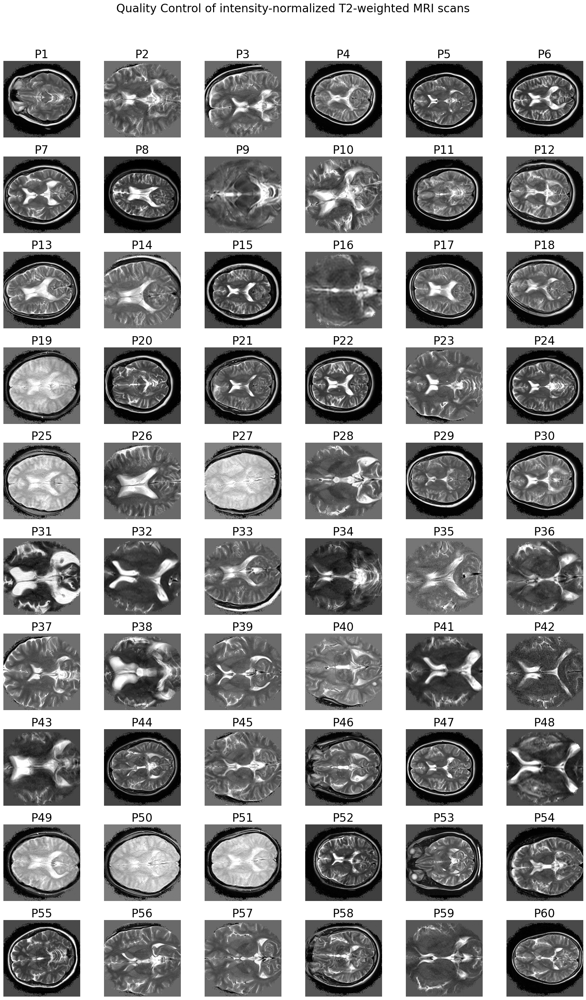

In [194]:
# Quality control intensity normalized scans (slice in the middle)

from pathlib import Path
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

root = Path(r"\\wsl$\Ubuntu\home\nina\ms_work_final\out")

def extract_patient_number(path):
    return int(path.parent.name.split("-")[1])

norm_files = sorted(
    root.glob("Patient-*/*_resampled224_masked_norm.nii.gz"),
    key=extract_patient_number
)

print("Number of scans:", len(norm_files))

def norm_slice(sl):
    return (sl - sl.min()) / (sl.max() - sl.min() + 1e-8)

n_show = min(60, len(norm_files))
cols = 6
rows = int(np.ceil(n_show / cols))

fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 3))
axes = np.array(axes).reshape(rows, cols)

for i in range(rows * cols):
    ax = axes.flat[i]

    if i < n_show:
        f = norm_files[i]
        patient_num = extract_patient_number(f)
        patient_label = f"P{patient_num}"

        data = nib.load(str(f)).get_fdata()

        if data.ndim == 4:
            data = data[..., 0]

        z = data.shape[2] // 2
        sl = norm_slice(data[:, :, z])

        ax.imshow(np.rot90(sl), cmap="gray")
        ax.set_title(patient_label, fontsize=24)
        ax.axis("off")
    else:
        ax.axis("off")

plt.suptitle("Quality Control of intensity-normalized T2-weighted MRI scans", fontsize=24)
plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.savefig("qc_normalized_middle_slices.png", dpi=300, bbox_inches="tight")
plt.show()

In [198]:
# differences in affines --> header fix step (important for the next step (Nifti mask)) 
# make consistency in the header without changing the voxeldata 

from pathlib import Path
import nibabel as nib
import numpy as np

root = Path(r"\\wsl$\Ubuntu\home\nina\ms_work_final\out")  
files = sorted(root.glob("Patient-*/*_resampled224_masked_norm.nii.gz"))

ref = nib.load(str(files[0]))
ref_aff = ref.affine
ref_hdr = ref.header.copy()

out_dir = root / "FINAL_headerfixed"
out_dir.mkdir(exist_ok=True)

fixed = []
for f in files:
    img = nib.load(str(f))
    data = img.get_fdata()

    new_img = nib.Nifti1Image(data.astype(np.float32), ref_aff, ref_hdr)
    out_path = out_dir / f.name.replace(".nii.gz", "_hf.nii.gz")
    nib.save(new_img, str(out_path))
    fixed.append(out_path)

print("Saved:", len(fixed), "->", out_dir)
print("Example:", fixed[0])

# Quality check headerfix 
root = Path(r"\\wsl$\Ubuntu\home\nina\ms_work_final\out")

orig_files = sorted(root.glob("Patient-*/*_resampled224_masked_norm.nii.gz"))
hf_dir = root / "FINAL_headerfixed"

for orig_path in orig_files:
    base = orig_path.name.replace(".nii.gz", "_hf.nii.gz")
    hf_path = hf_dir / base

    if hf_path.exists():
        orig = nib.load(str(orig_path)).get_fdata()
        hf = nib.load(str(hf_path)).get_fdata()

        diff = np.max(np.abs(orig - hf))
        print(orig_path.name, "max diff:", diff)

Saved: 60 -> \\wsl$\Ubuntu\home\nina\ms_work_final\out\FINAL_headerfixed
Example: \\wsl$\Ubuntu\home\nina\ms_work_final\out\FINAL_headerfixed\P001_resampled224_masked_norm_hf.nii.gz
P001_resampled224_masked_norm.nii.gz max diff: 1.1897606011501694e-07
P010_resampled224_masked_norm.nii.gz max diff: 1.1920627907002768e-07
P011_resampled224_masked_norm.nii.gz max diff: 1.1920394360487307e-07
P012_resampled224_masked_norm.nii.gz max diff: 1.192086651613522e-07
P013_resampled224_masked_norm.nii.gz max diff: 1.1919599396392755e-07
P014_resampled224_masked_norm.nii.gz max diff: 1.1920614362281867e-07
P015_resampled224_masked_norm.nii.gz max diff: 1.1920632125850261e-07
P016_resampled224_masked_norm.nii.gz max diff: 1.1920401776777112e-07
P017_resampled224_masked_norm.nii.gz max diff: 1.1920859988023835e-07
P018_resampled224_masked_norm.nii.gz max diff: 1.1920624176653405e-07
P019_resampled224_masked_norm.nii.gz max diff: 5.960458016041059e-08
P002_resampled224_masked_norm.nii.gz max diff: 1.1

In [2]:
# Make a NifTI-masker in Nilearn 
# This contains the voxels that need to be included and excluded 
# standardize = false --> standardising later on in the ML pipeline to prevent data leakage 
# transform everything into ML feature matrix 

from pathlib import Path
import numpy as np
import nibabel as nib
from nilearn.input_data import NiftiMasker

root = Path(r"\\wsl$\Ubuntu\home\nina\ms_work_final\out")
files = sorted((root / "FINAL_headerfixed").glob("*_hf.nii.gz"))

mask_path = root / "MAIN_mask.nii.gz"
masker = NiftiMasker(mask_img=str(mask_path), standardize=False) 
X_mri = masker.fit_transform([str(f) for f in files]) 

print("X_mri shape:", X_mri.shape)


C:\Users\nina-\AppData\Local\Temp\ipykernel_20168\4156359927.py:9: FutureWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  from nilearn.input_data import NiftiMasker
C:\Users\nina-\AppData\Local\Temp\ipykernel_20168\4156359927.py:16: UserWarning: [NiftiMasker.fit] Generation of a mask has been requested (imgs != None) while a mask was given at masker creation. Given mask will be used.
  X_mri = masker.fit_transform([str(f) for f in files])


X_mri shape: (60, 549819)


In [27]:
# load patient information data,
# select target variable,
# links it to MRI scans via patient IDs, 
# convert everything to NumPy for machine learning, 
# check if MRI scans were correctly matched to their corresponding clinical labels. 

import os
import pandas as pd
import numpy as np

patient_info_path = DATASET_DIR / "Supplementary Table 1 for patient info.xlsx"
patient_info = pd.read_excel(patient_info_path)
patient_info = patient_info.iloc[1:].reset_index(drop=True)
patient_info.shape[1]
patient_info.columns = [
    "ID", "Gender", "Age", "Age of onset", "EDSS",
    "MRI-EDSS < 2 months", "Types of Medicines",
    "Presenting Symptom", "Co-morbidity",
    "Pyramidal", "Cerebella", "Brain stem", "Sensory",
    "Sphincters", "Visual", "Mental", "Speech",
    "Motor System", "Sensory System", "Coordination",
    "Gait", "Bowel and bladder function", "Mobility",
    "Mental State", "Optic discs", "Fields",
    "Nystagmus", "Ocular Movement", "Swallowing"
]

isolated_columns = patient_info[["ID", "Motor System"]]
print(isolated_columns)

groups = np.array([int(f.name.split("_")[0].replace("P","")) for f in files])

labels = patient_info[["ID", "Motor System"]].set_index("ID")
y = labels.loc[groups, "Motor System"].to_numpy()

print("X_mri:", X_mri.shape)
print("groups:", groups.shape, "unique:", len(np.unique(groups)))
print("y:", y.shape, "unique:", np.unique(y))
 
y = np.asarray(y).ravel()          
y = y.astype(int)                

groups = np.asarray(groups).ravel()  
X_mri = np.asarray(X_mri)            

print("y dtype:", y.dtype, "unique:", np.unique(y))
print("groups dtype:", groups.dtype, "n_unique:", len(np.unique(groups)))

missing_ids = set(groups) - set(patient_info["ID"])
print("Missing IDs in patient_info:", missing_ids)
print("Amount of missing y labels:", pd.isna(y).sum())
print("X_mri samples:", X_mri.shape[0])
print("groups length:", len(groups))
print("y length:", len(y))
check_df = pd.DataFrame({
    "file": [f.name for f in files],
    "patient_id": groups,
    "motor_system_label": y
})
print(check_df.head(10))


    ID Motor System
0    1            1
1    2            1
2    3            1
3    4            1
4    5            0
5    6            1
6    7            1
7    8            0
8    9            1
9   10            1
10  11            1
11  12            1
12  13            1
13  14            1
14  15            0
15  16            1
16  17            0
17  18            1
18  19            1
19  20            0
20  21            0
21  22            0
22  23            0
23  24            0
24  25            1
25  26            0
26  27            1
27  28            0
28  29            0
29  30            1
30  31            0
31  32            0
32  33            1
33  34            0
34  35            1
35  36            1
36  37            0
37  38            1
38  39            1
39  40            0
40  41            1
41  42            0
42  43            0
43  44            1
44  45            0
45  46            1
46  47            1
47  48            0
48  49            1


First 10 groups: [ 1  2  3  4  5  6  7  8  9 10]
First 10 y: [1 1 1 1 0 1 1 0 1 1]
Any duplicate groups? False
Row mean range: -4.218908400750081e-09 -> 2.447535913646554e-09
Row std range : 0.9999999957283525 -> 1.000000004209277
Zero fraction : 0.0 -> 0.0


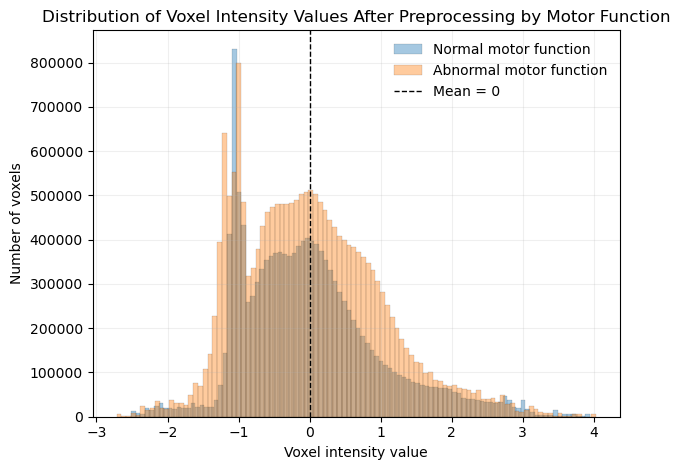

In [39]:
# EDA MRI_matrix 
import numpy as np
import matplotlib.pyplot as plt

print("First 10 groups:", groups[:10])
print("First 10 y:", y[:10])

u, c = np.unique(groups, return_counts=True)
print("Any duplicate groups?", np.any(c > 1))


# row stats 
X = np.asarray(X_mri)

row_mean = X.mean(axis=1)
row_std  = X.std(axis=1)
row_zero = (X == 0).mean(axis=1)

print("Row mean range:", row_mean.min(), "->", row_mean.max())
print("Row std range :", row_std.min(),  "->", row_std.max())
print("Zero fraction :", row_zero.min(), "->", row_zero.max())

X_no = X[y == 0].ravel()
X_yes = X[y == 1].ravel()
bins=100

plt.hist(
    X_no,
    bins=bins,
    alpha=0.4,
    edgecolor="black",
    linewidth=0.2,
    label="Normal motor function"
)

plt.hist(
    X_yes,
    bins=bins,
    alpha=0.4,
    edgecolor="black",
    linewidth=0.2,
    label="Abnormal motor function"
)

plt.axvline(0, linestyle="--", linewidth=1, label="Mean = 0", color="black")

plt.title("Distribution of Voxel Intensity Values After Preprocessing by Motor Function")
plt.xlabel("Voxel intensity value")
plt.ylabel("Number of voxels")
plt.legend(frameon=False)
plt.tight_layout()
plt.grid(alpha=0.2)
plt.show()



=== START PCA and NMF (LOPO) ===

--- k = 10 ---
  Fold 1/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 2/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 3/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 4/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 5/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 6/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 7/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 8/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 9/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 10/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 11/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 12/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 13/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 14/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 15/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 16/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 17/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 18/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 19/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 20/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 21/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 22/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 23/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 24/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 25/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 26/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 27/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 28/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 29/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 30/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 31/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 32/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 33/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 34/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 35/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 36/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 37/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 38/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 39/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 40/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 41/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 42/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 43/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 44/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 45/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 46/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 47/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 48/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 49/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 50/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 51/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 52/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 53/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 54/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 55/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 56/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 57/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 58/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 59/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 60/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


k = 10 done
Mean PCA error: 0.6919
Mean NMF error: 0.6975

--- k = 20 ---
  Fold 1/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 2/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 3/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 4/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 5/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 6/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 7/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 8/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 9/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 10/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 11/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 12/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 13/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 14/60
    → PCA
    → NMF
  Fold 15/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 16/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 17/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 18/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 19/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 20/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 21/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 22/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 23/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 24/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 25/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 26/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 27/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 28/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 29/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 30/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 31/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 32/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 33/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 34/60
    → PCA
    → NMF
  Fold 35/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 36/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 37/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 38/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 39/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 40/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 41/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 42/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 43/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 44/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 45/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 46/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 47/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 48/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 49/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 50/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 51/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 52/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 53/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 54/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 55/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 56/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 57/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 58/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 59/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 60/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


k = 20 done
Mean PCA error: 0.6752
Mean NMF error: 0.6814

--- k = 30 ---
  Fold 1/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 2/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 3/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 4/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 5/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 6/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 7/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 8/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 9/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 10/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 11/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 12/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 13/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 14/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 15/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 16/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 17/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 18/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 19/60
    → PCA
    → NMF
  Fold 20/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 21/60
    → PCA
    → NMF
  Fold 22/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 23/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 24/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 25/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 26/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 27/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 28/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 29/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 30/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 31/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 32/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 33/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 34/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 35/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 36/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 37/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 38/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 39/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 40/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 41/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 42/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 43/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 44/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 45/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 46/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 47/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 48/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 49/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 50/60
    → PCA
    → NMF
  Fold 51/60
    → PCA
    → NMF
  Fold 52/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 53/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 54/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 55/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 56/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 57/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 58/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 59/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 60/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


k = 30 done
Mean PCA error: 0.6664
Mean NMF error: 0.6731

--- k = 40 ---
  Fold 1/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 2/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 3/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 4/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 5/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 6/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 7/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 8/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 9/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 10/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 11/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 12/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 13/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 14/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 15/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 16/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 17/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 18/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 19/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 20/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 21/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 22/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 23/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 24/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 25/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 26/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 27/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 28/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 29/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 30/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 31/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 32/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 33/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 34/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 35/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 36/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 37/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 38/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 39/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 40/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 41/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 42/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 43/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 44/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 45/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 46/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 47/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 48/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 49/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 50/60
    → PCA
    → NMF
  Fold 51/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 52/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 53/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 54/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 55/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 56/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 57/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 58/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 59/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 60/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


k = 40 done
Mean PCA error: 0.6574
Mean NMF error: 0.6662

--- k = 50 ---
  Fold 1/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 2/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 3/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 4/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 5/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 6/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 7/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 8/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 9/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 10/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 11/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 12/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 13/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 14/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 15/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 16/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 17/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 18/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 19/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 20/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 21/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 22/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 23/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 24/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 25/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 26/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 27/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 28/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 29/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 30/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 31/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 32/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 33/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 34/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 35/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 36/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 37/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 38/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 39/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 40/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 41/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 42/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 43/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 44/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 45/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 46/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 47/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 48/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 49/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 50/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 51/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 52/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 53/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 54/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 55/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 56/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 57/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 58/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 59/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 60/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


k = 50 done
Mean PCA error: 0.6514
Mean NMF error: 0.6622

--- k = 58 ---
  Fold 1/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 2/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 3/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 4/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 5/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 6/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 7/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 8/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 9/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 10/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 11/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 12/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 13/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 14/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 15/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 16/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 17/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 18/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 19/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 20/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 21/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 22/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 23/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 24/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 25/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 26/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 27/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 28/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 29/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 30/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 31/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 32/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 33/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 34/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 35/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 36/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 37/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 38/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 39/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 40/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 41/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 42/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 43/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 44/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 45/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 46/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 47/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 48/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 49/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 50/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 51/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 52/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 53/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 54/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 55/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 56/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 57/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 58/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 59/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


  Fold 60/60
    → PCA
    → NMF


C:\Users\nina-\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


k = 58 done
Mean PCA error: 0.6471
Mean NMF error: 0.6606


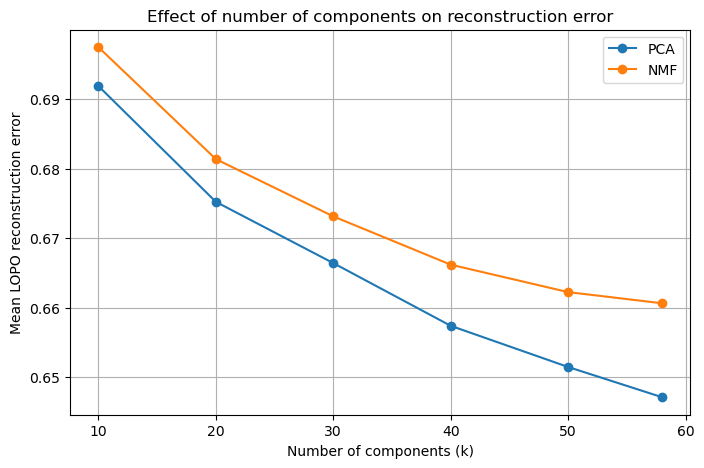

In [64]:
# PCA versus NMF 
# PCA --> StandardScaler
# NMF --> MinMaxScaler 
# use X_mri --> split it with leaveOneGroupOut --> data scalen, fit and transform op train data, pca or nmf trainen, project on test data, transform back to original space and scale, 
# compute reconstruction error (MSE) 

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import LeaveOneGroupOut
from sklearn.decomposition import PCA, NMF
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import mean_squared_error

SEED = 42 
Ks = [10,20,30,40,50,58]
outer = LeaveOneGroupOut()

def pca_mse(X_train, X_test, k):
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    pca = PCA(n_components=k, random_state=SEED)
    pca.fit(X_train_scaled)

    X_test_reconstructed = pca.inverse_transform(pca.transform(X_test_scaled))
    X_test_reconstructed_orig = scaler.inverse_transform(X_test_reconstructed)
    mse = mean_squared_error(X_test, X_test_reconstructed_orig)
    return mse

def nmf_mse(X_train, X_test, k):
    scaler = MinMaxScaler(clip=True) 
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    nmf = NMF(n_components=k, random_state=SEED, max_iter=200)  
    nmf.fit(X_train_scaled)

    X_test_reconstructed = nmf.inverse_transform(nmf.transform(X_test_scaled))
    X_test_reconstructed_orig = scaler.inverse_transform(X_test_reconstructed)
    mse = mean_squared_error(X_test, X_test_reconstructed_orig)
    return mse

pca_errors = []
nmf_errors = []

n_folds = len(np.unique(groups))

print("=== START PCA and NMF (LOPO) ===")

for k in Ks:
    print(f"\n--- k = {k} ---")
    pca_fold_errors = []
    nmf_fold_errors = []

    for fold, (train_idx, test_idx) in enumerate(outer.split(X_mri, groups=groups), start=1):
        print(f"  Fold {fold}/{n_folds}")
        
        X_train = X_mri[train_idx]
        X_test = X_mri[test_idx]
        print("    → PCA")
        pca_error = pca_mse(X_train, X_test, k)
        print("    → NMF")
        nmf_error = nmf_mse(X_train, X_test, k)

        pca_fold_errors.append(pca_error)
        nmf_fold_errors.append(nmf_error)
       
    pca_errors.append(np.mean(pca_fold_errors))
    nmf_errors.append(np.mean(nmf_fold_errors))

    print(f"k = {k} done")
    print(f"Mean PCA error: {np.mean(pca_fold_errors):.4f}")
    print(f"Mean NMF error: {np.mean(nmf_fold_errors):.4f}")

plt.figure(figsize=(8, 5))
plt.plot(Ks, pca_errors, marker="o", label="PCA")
plt.plot(Ks, nmf_errors, marker="o", label="NMF")
plt.xlabel("Number of components (k)")
plt.ylabel("Mean LOPO reconstruction error")
plt.title("Effect of number of components on reconstruction error")
plt.legend()
plt.grid(True)
plt.show()

In [18]:
import numpy as np
from sklearn.model_selection import LeaveOneGroupOut
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, recall_score, roc_auc_score, f1_score, roc_curve

SEEDS = list(range(42, 52))  
k = 58
outer = LeaveOneGroupOut()


def make_nb(k, seed):
    return Pipeline([
        ("scaler", StandardScaler()),
        ("pca", PCA(n_components=k, random_state=seed)),
        ("clf", GaussianNB())
    ])


def make_lr(k, seed):
    return Pipeline([
        ("scaler", StandardScaler()),
        ("pca", PCA(n_components=k, random_state=seed)),
        ("clf", LogisticRegression(max_iter=1000, random_state=seed))
    ])


def make_rf(k, seed):
    return Pipeline([
        ("scaler", StandardScaler()), 
        ("pca", PCA(n_components=k, random_state=seed)),
        ("clf", RandomForestClassifier(random_state=seed))
    ])


def evaluate_model_lopo(model, X, y, groups):
    y_true_all = []
    y_prob_all = []
    y_pred_all = []

    for train_idx, test_idx in outer.split(X, y, groups):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        model.fit(X_train, y_train)

        y_pred = model.predict(X_test)
        y_prob = model.predict_proba(X_test)[:, 1]

        y_true_all.extend(y_test)
        y_pred_all.extend(y_pred)
        y_prob_all.extend(y_prob)

    y_true_all = np.array(y_true_all)
    y_pred_all = np.array(y_pred_all)
    y_prob_all = np.array(y_prob_all)

    test_precision = precision_score(y_true_all, y_pred_all)
    test_recall = recall_score(y_true_all, y_pred_all)
    test_f1 = f1_score(y_true_all, y_pred_all)
    test_roc = roc_auc_score(y_true_all, y_prob_all)

    return test_precision, test_recall, test_f1, test_roc, y_true_all, y_prob_all

results_all = {
    "NB": {"precision": [], "recall": [], "f1": [], "roc": []},
    "LR": {"precision": [], "recall": [], "f1": [], "roc": []},
    "RF": {"precision": [], "recall": [], "f1": [], "roc": []}
}

for seed in SEEDS:
    print(f"\n=== Fixed k = {k} | Seed = {seed} ===")

    for name, model_fn in [("NB", make_nb), ("LR", make_lr), ("RF", make_rf)]:
        print(f"Running {name} (k={k}, seed={seed})...")

        te_p, te_r, te_f1, te_roc, y_true_all, y_prob_all = evaluate_model_lopo(
            model_fn(k, seed), X_mri, y, groups
        )

        results_all[name]["precision"].append(te_p)
        results_all[name]["recall"].append(te_r)
        results_all[name]["f1"].append(te_f1)
        results_all[name]["roc"].append(te_roc)

        print(f"\n{name}")
        print(f"TEST - Precision: {te_p:.3f} Recall: {te_r:.3f} F1: {te_f1:.3f} ROC: {te_roc:.3f}")

print("\n=== Variability over 10 seeds ===")

for name, metrics in results_all.items():
    print(f"\n{name}")

    for metric_name, values in metrics.items():
        values = np.array(values)
        print(f"{metric_name}: mean = {values.mean():.3f}, std = {values.std():.3f}")


=== Fixed k = 58 | Seed = 42 ===
Running NB (k=58, seed=42)...

NB
TEST - Precision: 0.516 Recall: 0.457 F1: 0.485 ROC: 0.477
Running LR (k=58, seed=42)...

LR
TEST - Precision: 0.690 Recall: 0.571 F1: 0.625 ROC: 0.673
Running RF (k=58, seed=42)...

RF
TEST - Precision: 0.583 Recall: 1.000 F1: 0.737 ROC: 0.613

=== Fixed k = 58 | Seed = 43 ===
Running NB (k=58, seed=43)...

NB
TEST - Precision: 0.516 Recall: 0.457 F1: 0.485 ROC: 0.477
Running LR (k=58, seed=43)...

LR
TEST - Precision: 0.690 Recall: 0.571 F1: 0.625 ROC: 0.673
Running RF (k=58, seed=43)...

RF
TEST - Precision: 0.586 Recall: 0.971 F1: 0.731 ROC: 0.530

=== Fixed k = 58 | Seed = 44 ===
Running NB (k=58, seed=44)...

NB
TEST - Precision: 0.516 Recall: 0.457 F1: 0.485 ROC: 0.477
Running LR (k=58, seed=44)...

LR
TEST - Precision: 0.690 Recall: 0.571 F1: 0.625 ROC: 0.673
Running RF (k=58, seed=44)...

RF
TEST - Precision: 0.583 Recall: 1.000 F1: 0.737 ROC: 0.602

=== Fixed k = 58 | Seed = 45 ===
Running NB (k=58, seed=45).

Observed ROC-AUC: 0.673
Permutation p-value: 0.015


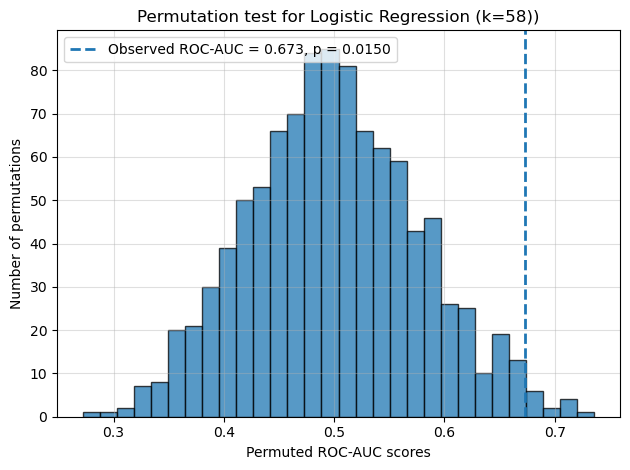

In [244]:
# permutation test: logistic regression 
# permutation test: shuffle only the test labels
# repeat 1000 times to obtain a chance distribution

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import LeaveOneGroupOut
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score

SEED = 42
k = 58
outer = LeaveOneGroupOut()

def make_lr(k):
    return Pipeline([
        ("scaler", StandardScaler()),
        ("pca", PCA(n_components=k, random_state=SEED)),
        ("clf", LogisticRegression(max_iter=1000,random_state=SEED))
    ])

y_true_all = []
y_prob_all = []

for train_idx, test_idx in outer.split(X_mri, y, groups):
    model = make_lr(k)
    model.fit(X_mri[train_idx], y[train_idx])
    y_prob = model.predict_proba(X_mri[test_idx])[:, 1]

    y_true_all.extend(y[test_idx])
    y_prob_all.extend(y_prob)

y_true_all = np.array(y_true_all)
y_prob_all = np.array(y_prob_all)

observed_auc = roc_auc_score(y_true_all, y_prob_all)

rng = np.random.default_rng(SEED)
perm_aucs = []

for _ in range(1000):
    y_perm = rng.permutation(y_true_all)   
    perm_auc = roc_auc_score(y_perm, y_prob_all)
    perm_aucs.append(perm_auc)

perm_aucs = np.array(perm_aucs)
p_value = (np.sum(perm_aucs >= observed_auc) + 1) / 1001

print("Observed ROC-AUC:", round(observed_auc, 3))
print("Permutation p-value:", round(p_value, 4))

plt.hist(perm_aucs, bins=30, 
        edgecolor= "black",
        alpha = 0.75,
        )
plt.axvline(observed_auc, linestyle='--',
           linewidth=2, 
           label=f"Observed ROC-AUC = {observed_auc:.3f}, p = {p_value:.4f}")
plt.xlabel("Permuted ROC-AUC scores")
plt.ylabel("Number of permutations")
plt.title("Permutation test for Logistic Regression (k=58))")
plt.grid(True, alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()


Total amount of voxels: 549819
Aantal MRI features: 549819
Aantal voxels in mask: 549819
Saved brain map to: \\wsl$\Ubuntu\home\nina\ms_work_final\out\feature_importance_inverse_transform_brainmap.nii.gz


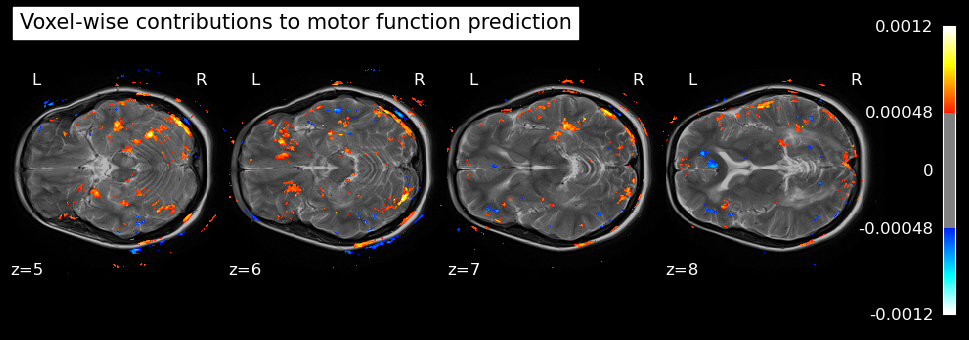

In [118]:
### RQ: Which MRI-derived voxel features contribute most strongly to the prediction
### of motor functioning after PCA-based dimensionality reduction?

# Feature importance with PCA inverse_transform -> brain map
# used the mask voxel framework and use one subject patient as a background 

from pathlib import Path
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
from nilearn import plotting
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression


SEED = 42
k = 58

root = Path(r"\\wsl$\Ubuntu\home\nina\ms_work_final\out")
mask_path = root / "MAIN_mask.nii.gz"
files = sorted((root / "FINAL_headerfixed").glob("*_hf.nii.gz"))
bg_path = files[29] #background patient 29

output_path = root / "feature_importance_inverse_transform_brainmap.nii.gz"


# Model
model = Pipeline([
    ("scaler", StandardScaler()),
    ("pca", PCA(n_components=k, random_state=SEED)),
    ("clf", LogisticRegression(max_iter=1000, random_state=SEED))
])

model.fit(X_mri, y)


# Feature importance and inverse transform 
scaler = model.named_steps["scaler"]
pca = model.named_steps["pca"]
clf = model.named_steps["clf"]

coef_pca = clf.coef_.squeeze()
coef_scaled = pca.inverse_transform(coef_pca.reshape(1, -1)).squeeze()
feature_importance = coef_scaled / scaler.scale_
threshold = np.percentile(np.abs(feature_importance), 98) #is this an okay treshold? 

n_voxels = len(feature_importance)
print("Total amount of voxels:", n_voxels)

# Mask
mask_img = nib.load(str(mask_path))
mask_data = mask_img.get_fdata().astype(bool)

print("Aantal MRI features:", X_mri.shape[1])
print("Aantal voxels in mask:", mask_data.sum())

# Brain map
brain_map = np.zeros(mask_data.shape)
brain_map[mask_data] = feature_importance

importance_img = nib.Nifti1Image(
    brain_map,
    affine=mask_img.affine
)

nib.save(importance_img, str(output_path))
print(f"Saved brain map to: {output_path}")

# Background subject MRI
bg_img = nib.load(str(bg_path))

cut_coords = np.linspace(1, 15, 15)
selected_coords = cut_coords[4:8]

plotting.plot_stat_map(
    importance_img,
    bg_img=bg_img,
    title="Voxel-wise contributions to motor function prediction",
    threshold=threshold,
    display_mode="z",
    cut_coords=selected_coords,
    cmap="cold_hot",
    colorbar = True 
)
plt.show()



In [ ]:
# Error analysis: subgroups age and gender
# groups gender: Male and Female
# groups age: <35 and >= 35 

import numpy as np
import pandas as pd
from sklearn.model_selection import LeaveOneGroupOut
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, roc_auc_score
import matplotlib.pyplot as plt

SEED = 42
k = 58
outer = LeaveOneGroupOut()
results = []

plt.rcParams.update({
    "font.size": 14,
    "axes.titlesize": 16,
    "axes.labelsize": 14,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12
})

# Patient IDs from groups and patient_info match exactly in order,
# so gender and age are correctly aligned with each MRI sample
subgroups = pd.DataFrame({
    "Subject": groups,
    "Gender": patient_info["Gender"],
    "Age": patient_info["Age"],
})

# exclude Gender = N due to small group (N=1)
subgroups_gender = subgroups[subgroups["Gender"].isin(["M", "F"])].copy()
subgroups_age = subgroups.copy()
subgroups_age["Age_group"] = np.where(subgroups_age["Age"] < 35, "<35", ">=35")

model = Pipeline([
    ("scaler", StandardScaler()),
    ("pca", PCA(n_components=k, random_state=SEED)),
    ("clf", LogisticRegression(max_iter=1000, random_state=SEED))
])

for tr, te in outer.split(X_mri, y, groups):
    model.fit(X_mri[tr], y[tr])

    y_pred = model.predict(X_mri[te])
    y_prob = model.predict_proba(X_mri[te])[:, 1]

    for i in range(len(te)):
        results.append({
            "Subject": groups[te][i],
            "y_true": y[te][i],
            "y_pred": y_pred[i],
            "y_prob": y_prob[i]
        })

results_all = pd.DataFrame(results)

results_gender = results_all.merge(subgroups_gender, on="Subject")
results_age = results_all.merge(subgroups_age, on="Subject")

def plot_confusion_matrix(sub, title):
    cm = confusion_matrix(sub["y_true"], sub["y_pred"])
    cm_norm = cm / cm.sum()

    precision = precision_score(sub["y_true"], sub["y_pred"])
    recall = recall_score(sub["y_true"], sub["y_pred"])
    f1 = f1_score(sub["y_true"], sub["y_pred"])
    roc_auc = roc_auc_score(sub["y_true"], sub["y_prob"])

    fig, ax = plt.subplots(figsize=(6.5, 6.5))

    im = ax.imshow(cm_norm, cmap="Blues", vmin=0, vmax=1)

    for i in range(2):
        for j in range(2):
            ax.text(
                j, i,
                f"{cm_norm[i, j]:.2f}",
                ha="center",
                va="center",
                fontsize=15,
                color="white" if cm_norm[i, j] > 0.30 else "#2f4f7f"
            )

    ax.set_title(title)
    ax.set_xlabel("Predicted label", fontsize=14)
    ax.set_ylabel("True label", fontsize=14)
    ax.set_xticks([0, 1])
    ax.set_yticks([0, 1])

    metrics_text = (
        f"Precision = {precision:.3f} | Recall = {recall:.3f}\n"
        f"F1-score = {f1:.3f} | ROC-AUC = {roc_auc:.3f}"
    )

    ax.text(
        0.5, -0.28,
        metrics_text,
        transform=ax.transAxes,
        ha="center",
        va="top",
        fontsize=13
    )

    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label("Proportion", fontsize=14)

    plt.tight_layout()
    plt.show()

print("\n=== Overall ===")
plot_confusion_matrix(
    results_all,
    f"Confusion Matrix (n={len(results_all)})"
)

print("\n=== Gender ===")
for g in ["F", "M"]:
    sub = results_gender[results_gender["Gender"] == g]
    print(f"\n{g} (n={len(sub)})")
    print(confusion_matrix(sub["y_true"], sub["y_pred"]))
    print(f"Precision: {precision_score(sub['y_true'], sub['y_pred']):.3f}")
    print(f"Recall: {recall_score(sub['y_true'], sub['y_pred']):.3f}")
    print(f"F1: {f1_score(sub['y_true'], sub['y_pred']):.3f}")
    print(f"ROC-AUC: {roc_auc_score(sub['y_true'], sub['y_prob']):.3f}")

    plot_confusion_matrix(
        sub,
        f"Gender: {g} — Confusion Matrix (n={len(sub)})"
    )

print("\n=== Age ===")
for a in ["<35", ">=35"]:
    sub = results_age[results_age["Age_group"] == a]
    print(f"\n{a} (n={len(sub)})")
    print(confusion_matrix(sub["y_true"], sub["y_pred"]))
    print(f"Precision: {precision_score(sub['y_true'], sub['y_pred']):.3f}")
    print(f"Recall: {recall_score(sub['y_true'], sub['y_pred']):.3f}")
    print(f"F1: {f1_score(sub['y_true'], sub['y_pred']):.3f}")
    print(f"ROC-AUC: {roc_auc_score(sub['y_true'], sub['y_prob']):.3f}")

    plot_confusion_matrix(
        sub,
        f"Age group: {a} — Confusion Matrix (n={len(sub)})"
    )